# Principal Component Analysis

PCA is run and the drivers of variance visualized.

In [1]:
import anndata as ad

adata = ad.read_h5ad("/Users/kpax/Documents/aep/study/MSC/lab/PPMI_Project_133_RNASeq/ppmi_adata.h5ad")

## Groups Overview

/var/folders/qb/t7qv2b9n33n2xzbjvg_dk_4c0000gn/T/ipykernel_10415/208216379.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_counts = adata.obs.groupby(['Gender', 'Diagnosis'])['Patient'].nunique().unstack()


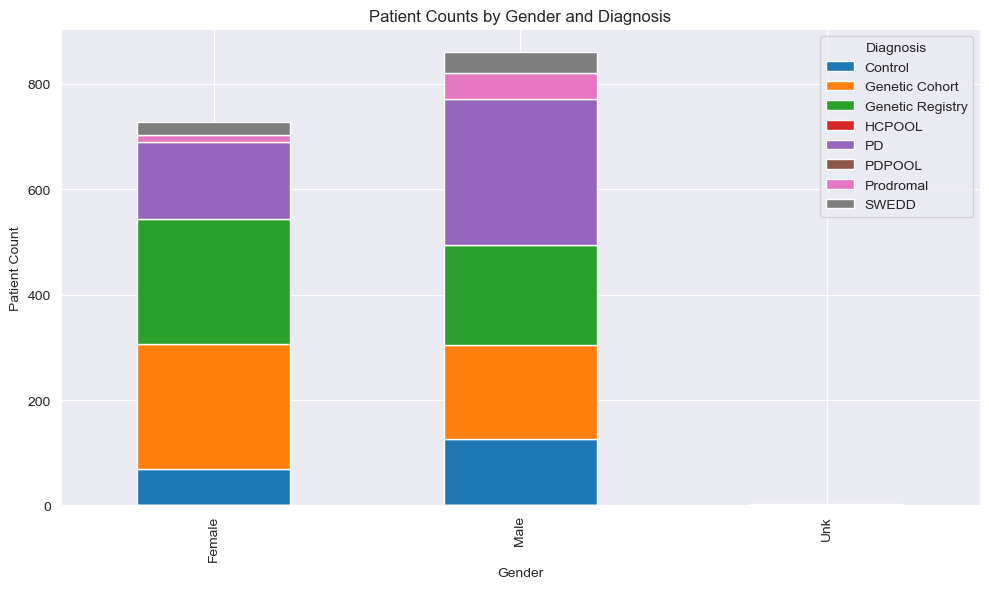

In [22]:
import matplotlib.pyplot as plt

patient_counts = adata.obs.groupby(['Gender', 'Diagnosis'])['Patient'].nunique().unstack()

patient_counts.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title('Patient Counts by Gender and Diagnosis')
plt.xlabel('Gender')
plt.ylabel('Patient Count')
plt.legend(title='Diagnosis')
plt.tight_layout()
plt.show()

/var/folders/qb/t7qv2b9n33n2xzbjvg_dk_4c0000gn/T/ipykernel_10415/1057221215.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_counts = adata.obs.groupby(['Gender', 'Age_Group'])['Patient'].nunique().unstack()


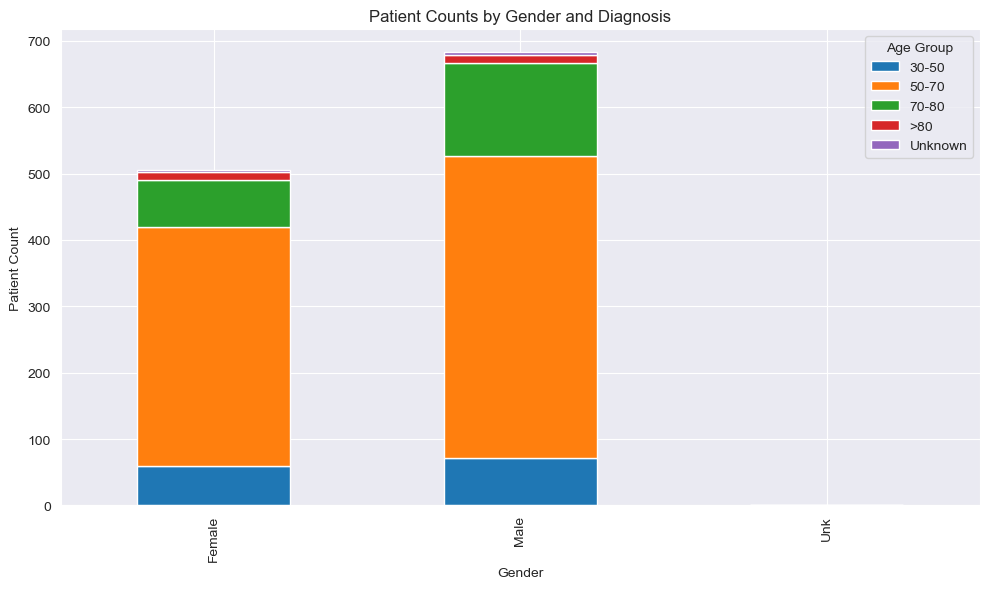

In [23]:
import matplotlib.pyplot as plt

patient_counts = adata.obs.groupby(['Gender', 'Age_Group'])['Patient'].nunique().unstack()

patient_counts.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title('Patient Counts by Gender and Age Group')
plt.xlabel('Gender')
plt.ylabel('Patient Count')
plt.legend(title='Age Group')
plt.tight_layout()
plt.show()

/var/folders/qb/t7qv2b9n33n2xzbjvg_dk_4c0000gn/T/ipykernel_10415/627628471.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_counts = adata.obs.groupby(['Gender', 'Genetic_Group'])['Patient'].nunique().unstack()


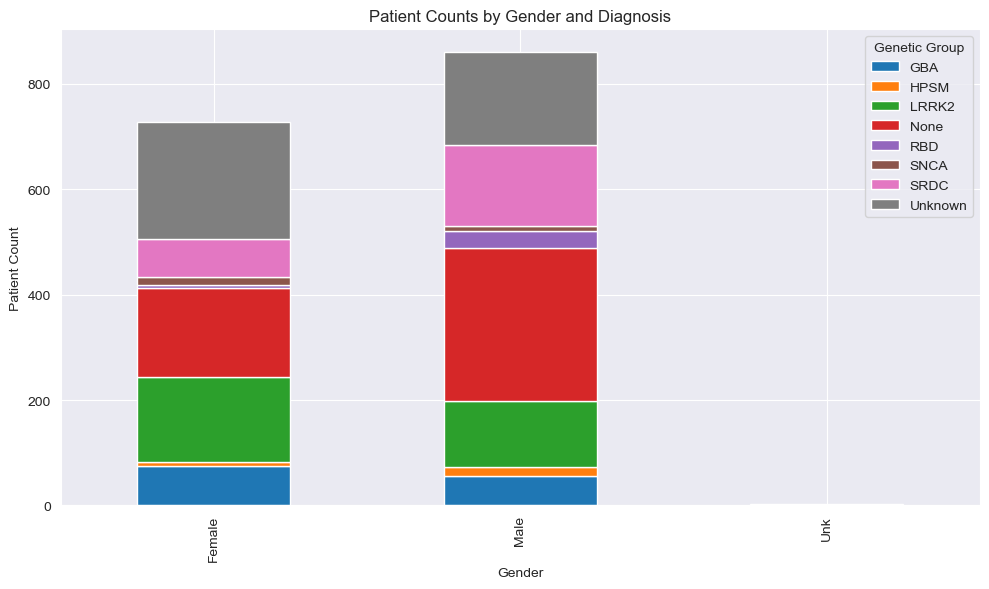

In [24]:
import matplotlib.pyplot as plt

patient_counts = adata.obs.groupby(['Gender', 'Genetic_Group'])['Patient'].nunique().unstack()

patient_counts.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title('Patient Counts by Gender and Diagnosis')
plt.xlabel('Gender')
plt.ylabel('Patient Count')
plt.legend(title='Genetic Group')
plt.tight_layout()
plt.show()

### PCA based on Diagnosis

In [3]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

sc.tl.pca(adata, layer='counts_log2', n_comps=8, svd_solver='arpack')

import pandas as pd
pcs_df = pd.DataFrame(
    adata.obsm['X_pca'][:, :8],
    columns=[f'PC{i+1}' for i in range(8)],
    index=adata.obs_names
)
pcs_df['Diagnosis'] = adata.obs['Diagnosis']
pcs_df['Gender'] = adata.obs['Gender']
pcs_df['Genetic_Group'] = adata.obs['Genetic_Group']
pcs_df['Age_Group'] = adata.obs['Age_Group']

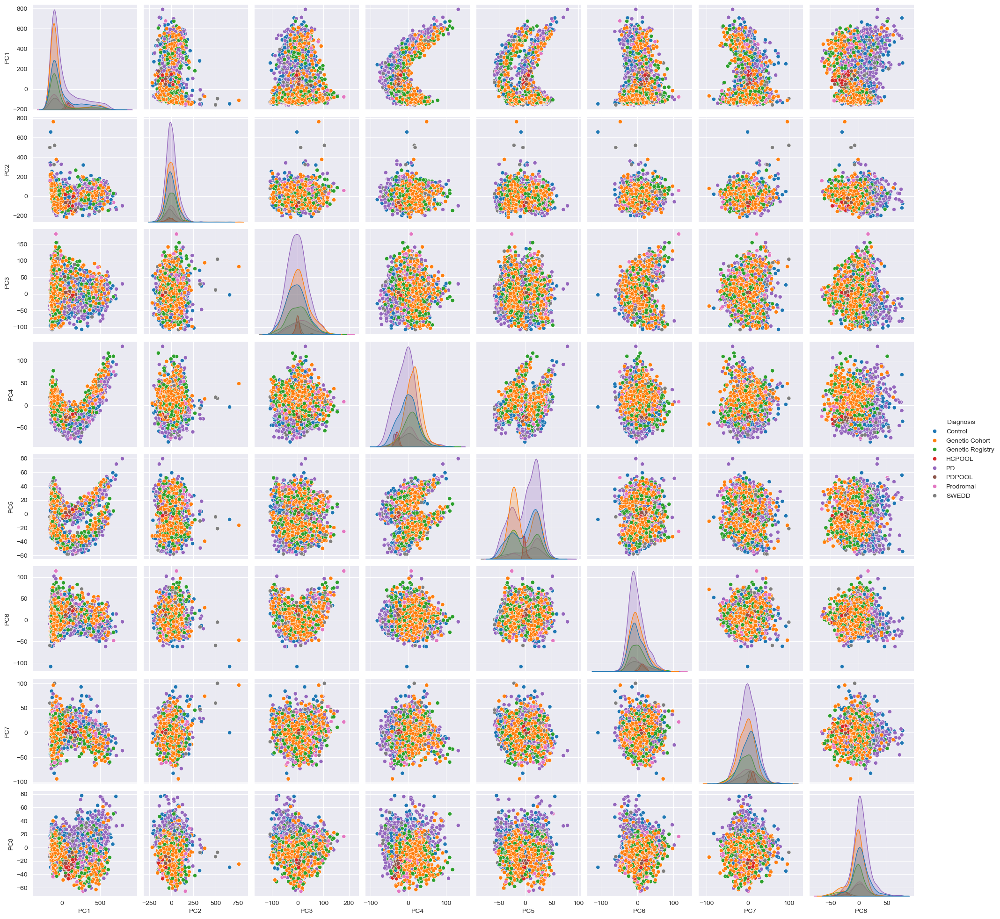

In [18]:

sns.pairplot(pcs_df, hue='Diagnosis')
plt.show()


## PCA based on Gender

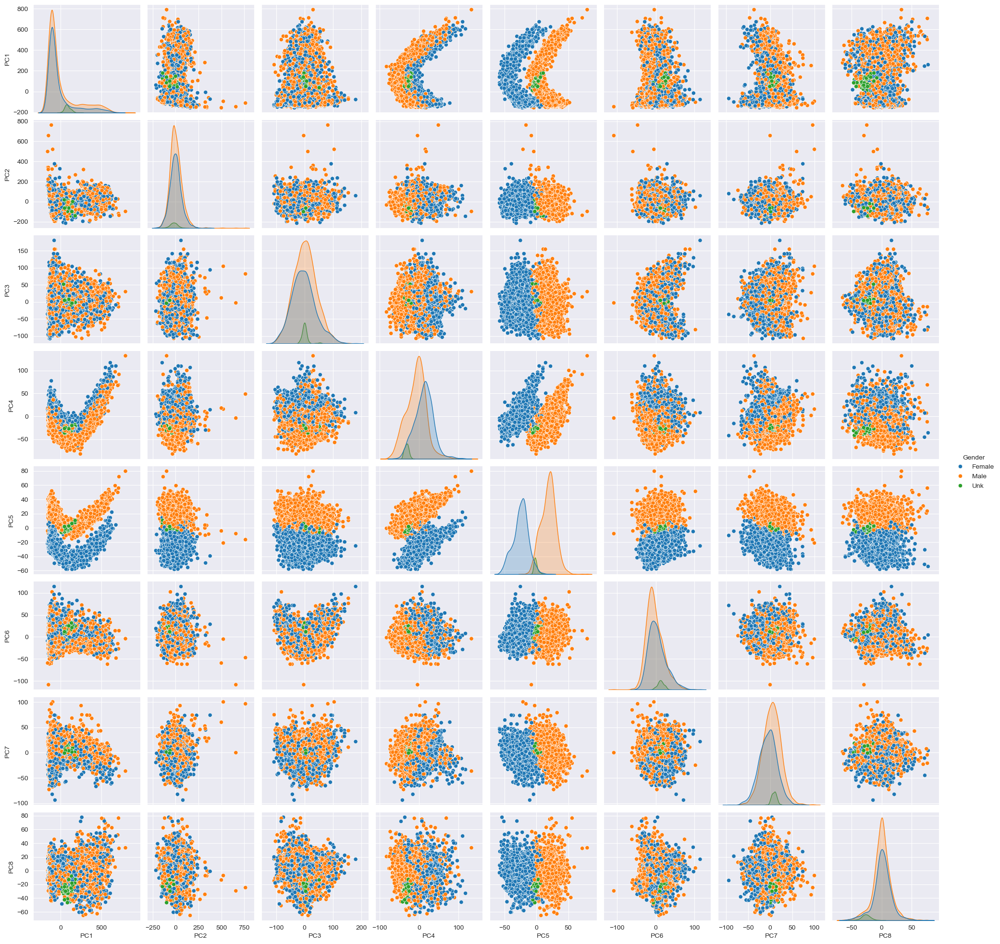

In [19]:
sns.pairplot(pcs_df, hue='Gender')
plt.show()

## PCA based on Genetic Group

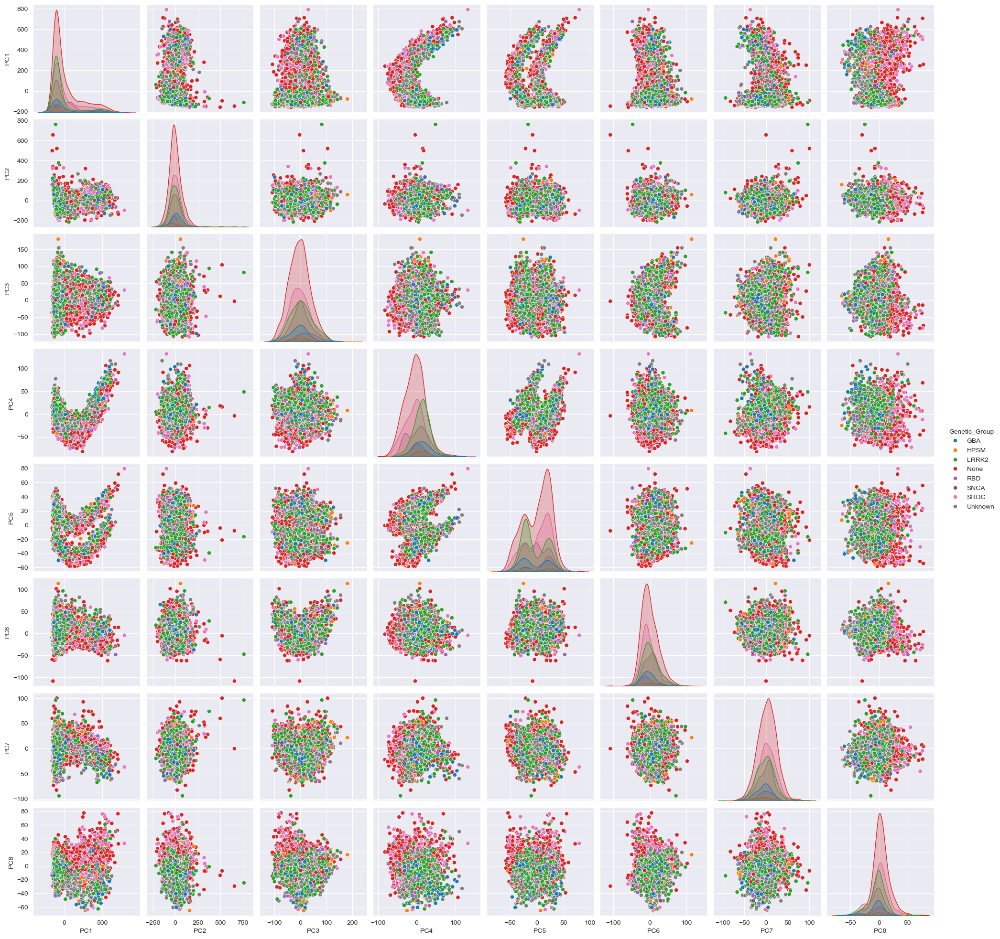

In [4]:
sns.pairplot(pcs_df, hue='Genetic_Group')
plt.show()

## PCA based on Age Group

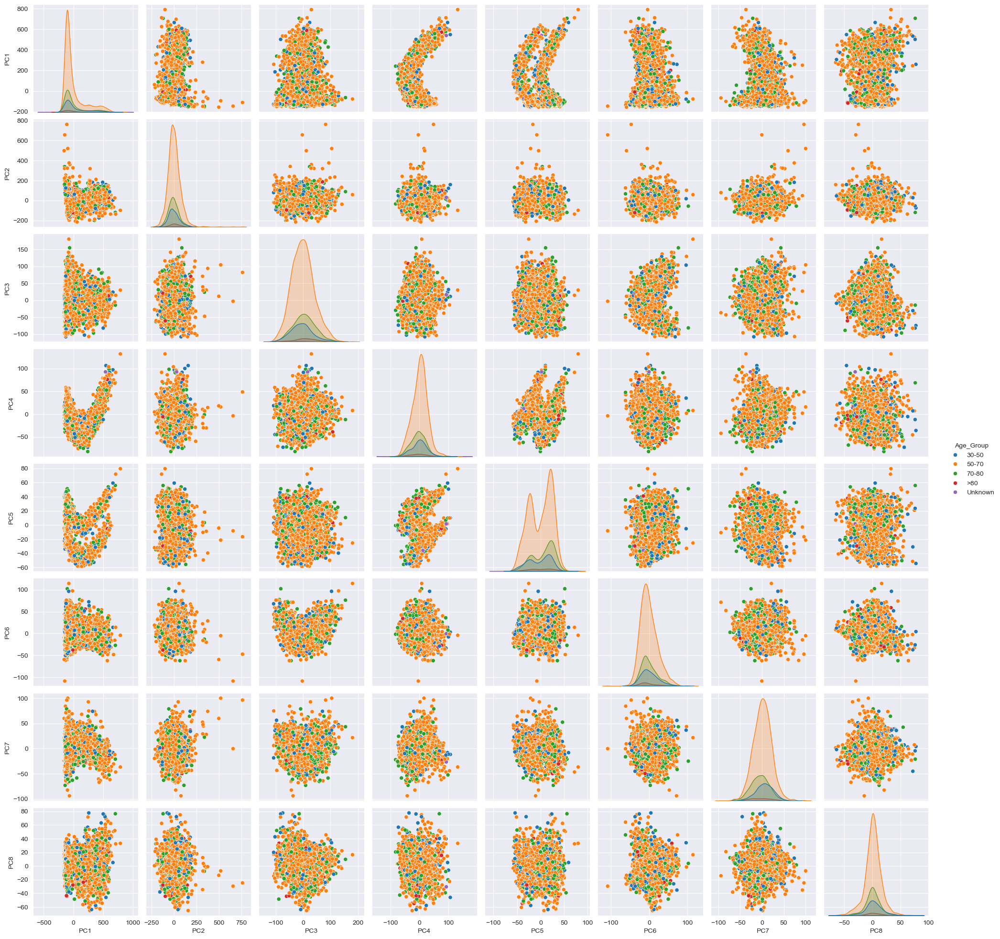

In [5]:
sns.pairplot(pcs_df, hue='Age_Group')
plt.show()

In [6]:
adata_male = adata[adata.obs['Gender'] == 'Male']
adata_female = adata[adata.obs['Gender'] == 'Female']

In [ ]:
adata_male_known_genetic_group = adata_male[~adata_male.obs['Genetic_Group'].isin(['None', 'Unknown'])]

In [19]:

adata_male_known_genetic_group = adata_male_known_genetic_group[adata_male_known_genetic_group.obs['Visit'] == 'BL']

In [20]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

sc.tl.pca(adata_male_known_genetic_group, layer='counts_log2', n_comps=8, svd_solver='arpack')

import pandas as pd
pcs_df = pd.DataFrame(
    adata_male_known_genetic_group.obsm['X_pca'][:, :8],
    columns=[f'PC{i+1}' for i in range(8)],
    index=adata_male_known_genetic_group.obs_names
)
pcs_df['Diagnosis'] = adata_male_known_genetic_group.obs['Diagnosis']
pcs_df['Age_Group'] = adata_male_known_genetic_group.obs['Age_Group']
pcs_df['Genetic_Group'] = adata_male_known_genetic_group.obs['Genetic_Group']

/opt/anaconda3/lib/python3.12/site-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


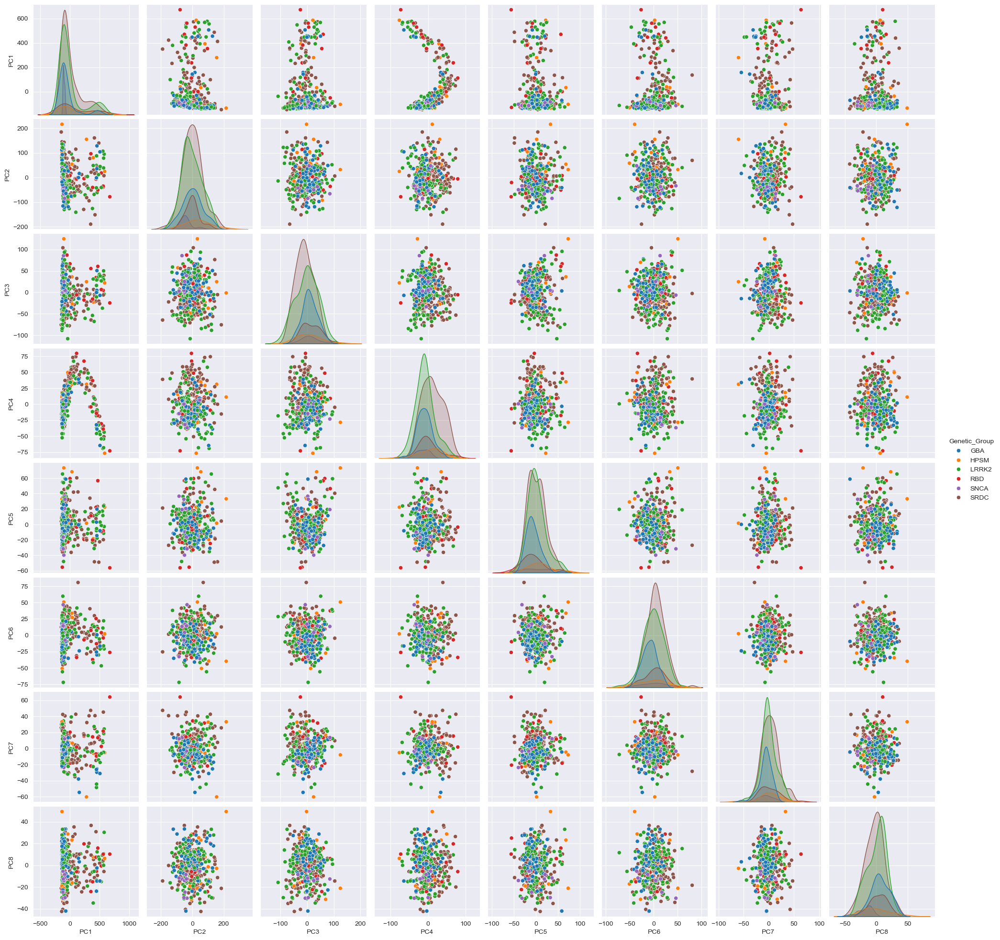

In [21]:
sns.pairplot(pcs_df, hue='Genetic_Group')
plt.show()